# Load libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import random
import time
import json
import numpy as np
import pandas as pd
import xarray as xr
import xskillscore as xs

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from scipy.stats import norm
from xskillscore import crps_quadrature, crps_ensemble

import sys
sys.path.append('/'.join(sys.path[0].split('/')[:-1]))
from modules.architectures import *

from modules.swag import data, models, utils, losses
from modules.swag.posteriors import SWAG

import modules.architectures as modelArchitectures
from modules.full_pipeline import compute_errors, _inner
from modules.plotting import plot_intervalmap, plot_signal
from modules.data import hp_to_equiangular
from modules.test import compute_rmse_healpix, compute_R2

In [3]:
description_epoch = 'all_const_len2_delta_6_architecture_loss_v0_2steps_constant_increasing_static_l3_long_connections_per_epoch'
figures_path = '../data/healpix/figures/' + description_epoch + '/'

config_file = 'config_s01_two_steps_small.json'

with open("../configs/" + config_file) as json_data_file:
        cfg = json.load(json_data_file)

# Define paths
datadir = cfg['directories']['datadir']
input_dir = datadir + cfg['directories']['input_dir']
model_save_path = datadir + cfg['directories']['model_save_path']
pred_save_path = datadir + cfg['directories']['pred_save_path']
metrics_path = datadir + cfg['directories']['metrics_path']

resolution = cfg['model_parameters']['resolution']
max_lead_time = cfg['training_constants']['max_lead_time']

lead_time = 6
lead_times = np.arange(lead_time, max_lead_time+lead_time, lead_time)

# Plot skillmaps of difference

## Interval

In [5]:
# Load mutliswag ensemble
multiswag = []
for i in range(10):
    filename = description_epoch + f"_s02_multiswag_ensemble_model{i+1}_epoch11_swag_scale01_aggregate.nc"
    ds = xr.open_dataset(pred_save_path+filename).chunk('auto')
    multiswag.append(ds)

multiswag_ds = xr.concat(multiswag, dim='member')

# Load ensemble model
ens_ds = []
for i in range(10):
    filename = description_epoch + f"_s02_ensemble_model{i+1}_epoch11.nc"
    ds = xr.open_dataset(pred_save_path+filename).chunk('auto')
    ens_ds.append(ds)

ens_ds = xr.concat(ens_ds, dim='member')

In [6]:
# load observations
obs = xr.open_mfdataset(pred_save_path + 'observations_nearest.nc', combine='by_coords')
# obs = obs.isel(time=slice(6,prediction_ds.time.shape[0]+6))
common_time = list(set(ens_ds.time.values).intersection(obs.time.values))
common_time.sort()
common_lead_time = list(set(ens_ds.lead_time.values).intersection(obs.lead_time.values))
common_lead_time.sort()
ens_ds = ens_ds.sel(dict(time=common_time, lead_time=common_lead_time))
multiswag_ds = multiswag_ds.sel(dict(time=common_time, lead_time=common_lead_time))
obs = obs.sel(dict(time=common_time, lead_time=common_lead_time)).chunk(multiswag[0].chunks)

In [7]:
def get_interval(preds, obs):
    min_pred = preds.min(axis=0)
    max_pred = preds.max(axis=0)

    interval = ((obs >= min_pred) & (obs <= max_pred)).drop('lat').drop('lon').compute()
    interval = interval.astype('uint8')
    
    return interval

diff = get_interval(multiswag_ds, obs) - get_interval(ens_ds, obs)

interval_map = diff.mean(['time'])

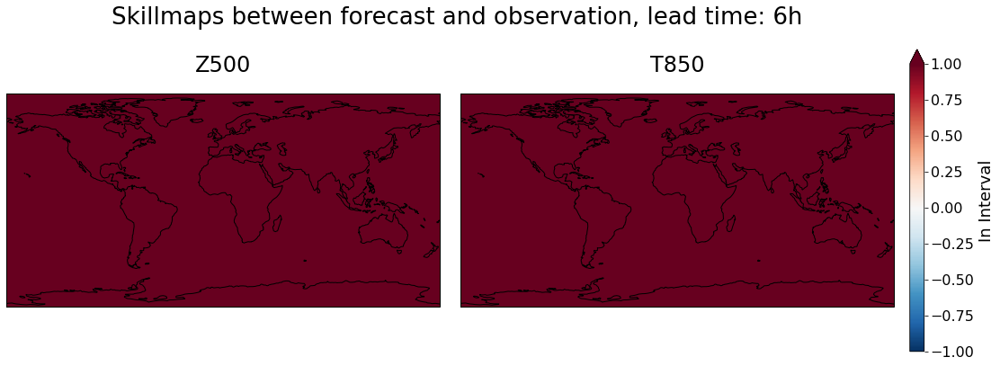

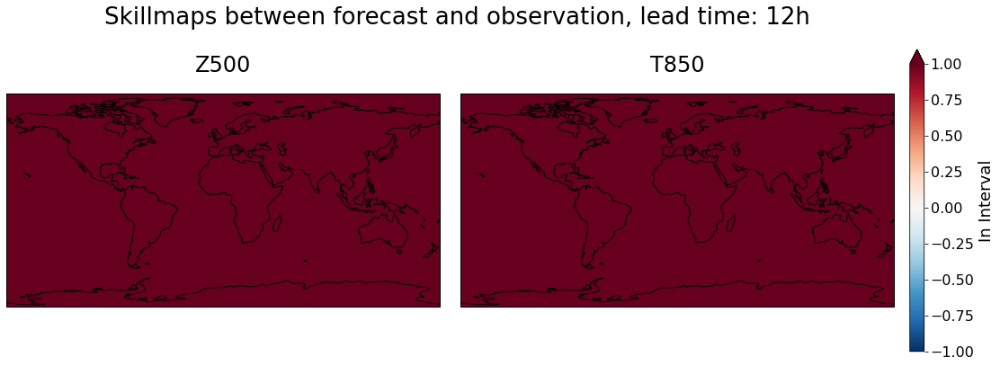

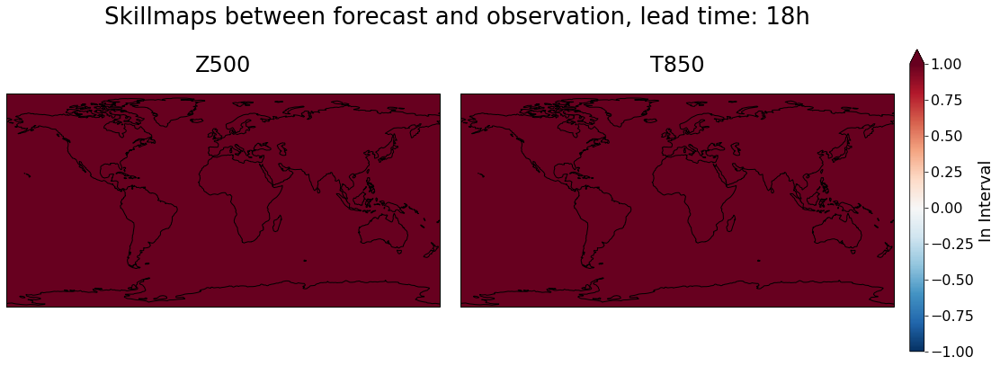

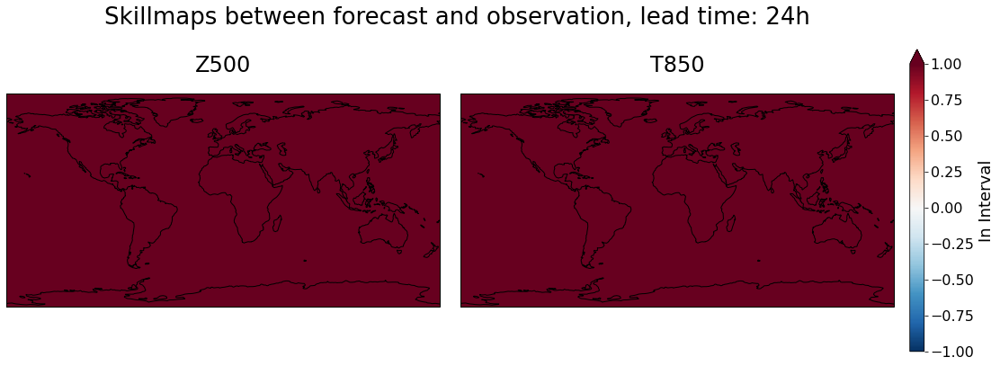

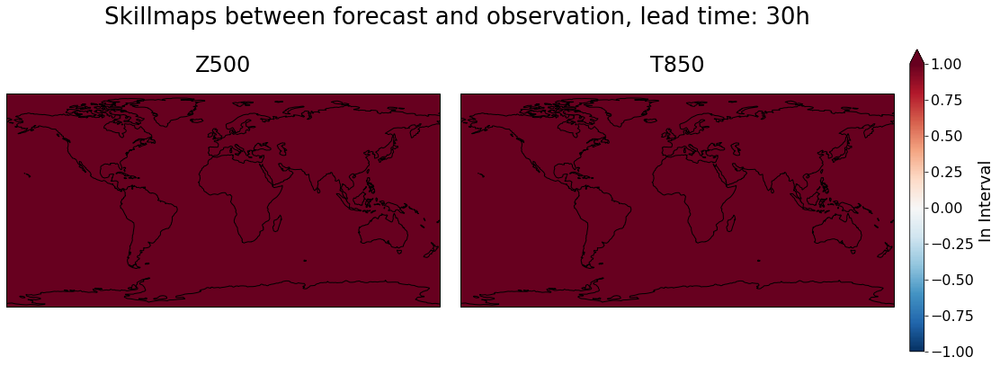

...

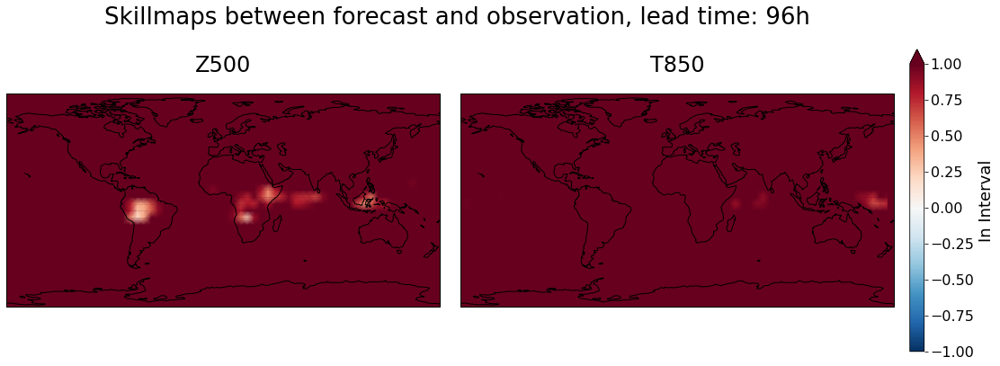

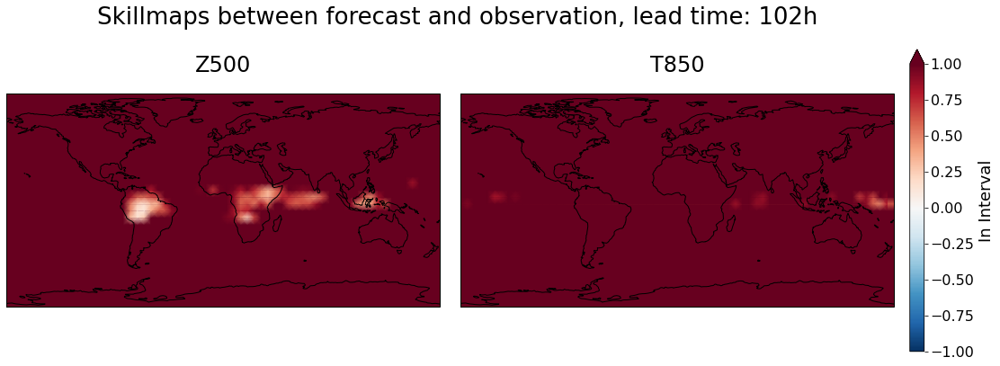

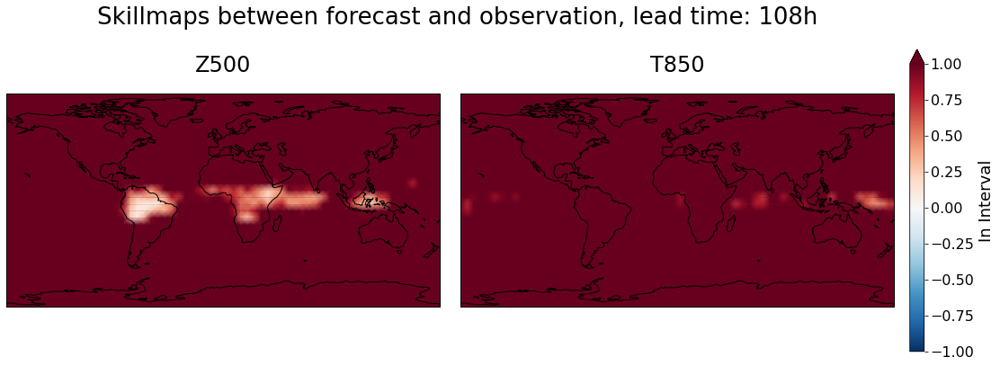

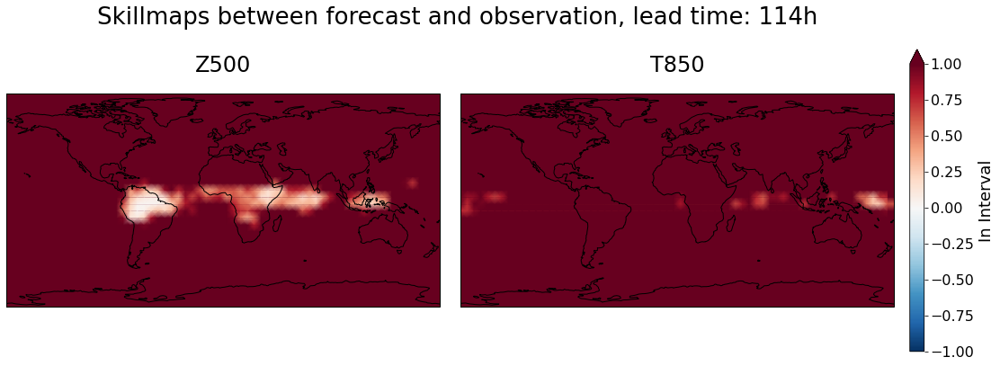

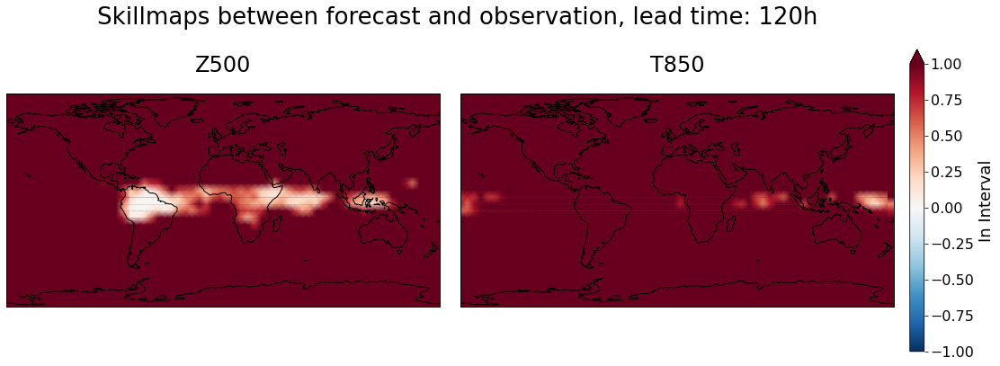

In [9]:
plot_intervalmap(interval_map, description_epoch, 'In Interval', lead_times, resolution, figures_path, 
                 min_max=[-1,1],save=False)

# R2

In [10]:
filename_ens = description_epoch + "_s02_ensemble_epoch_11_median.nc"
filename_multiswag = description_epoch + "_s02_multiswag_ensemble_epoch_11_swag_scale01_aggregate_median.nc"

In [11]:
multiswag_ds = xr.open_dataset(pred_save_path + filename_multiswag).drop('lat').drop('lon')
ens_ds = xr.open_dataset(pred_save_path + filename_ens).drop('lat').drop('lon')

# load observations
obs = xr.open_mfdataset(pred_save_path + 'observations_nearest.nc', combine='by_coords')
# obs = obs.isel(time=slice(6,prediction_ds.time.shape[0]+6))
common_time = list(set(ens_ds.time.values).intersection(obs.time.values))
common_time.sort()
common_lead_time = list(set(ens_ds.lead_time.values).intersection(obs.lead_time.values))
common_lead_time.sort()
ens_ds = ens_ds.sel(dict(time=common_time, lead_time=common_lead_time))
multiswag_ds = multiswag_ds.sel(dict(time=common_time, lead_time=common_lead_time))
obs = obs.sel(dict(time=common_time, lead_time=common_lead_time))

In [12]:
corr_map_multiswag = compute_R2(multiswag_ds, obs)
corr_map_ens = compute_R2(ens_ds, obs)

diff = corr_map_multiswag - corr_map_ens

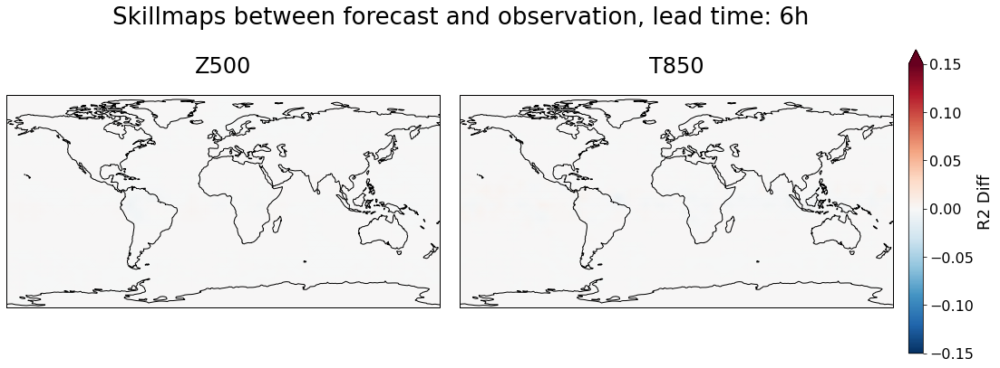

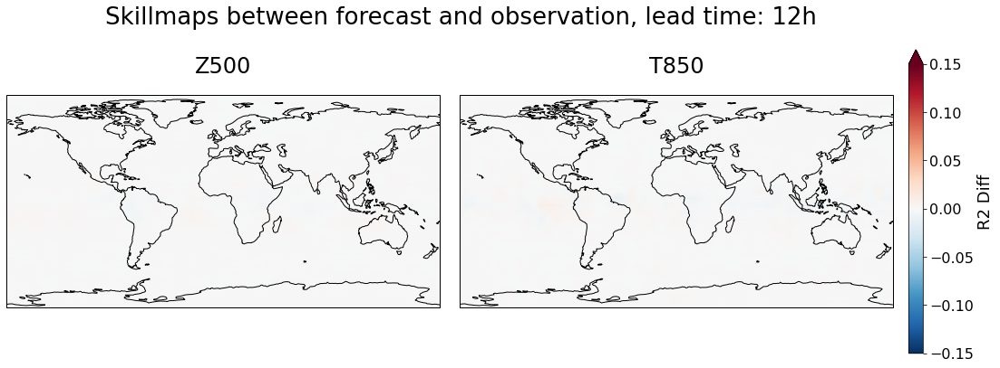

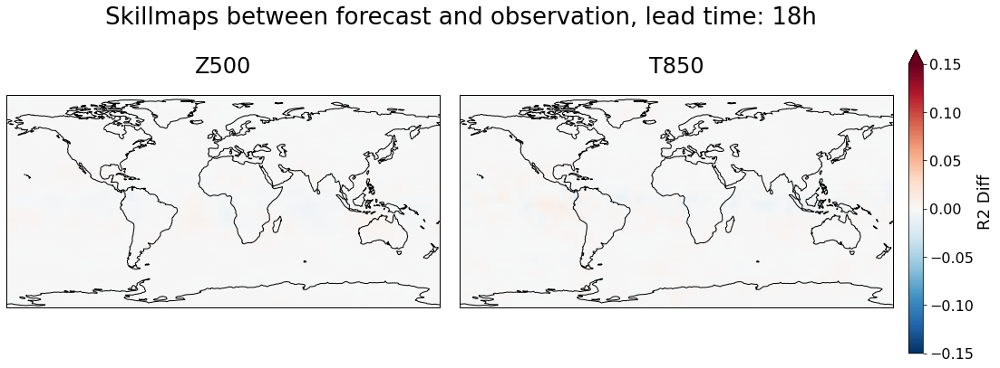

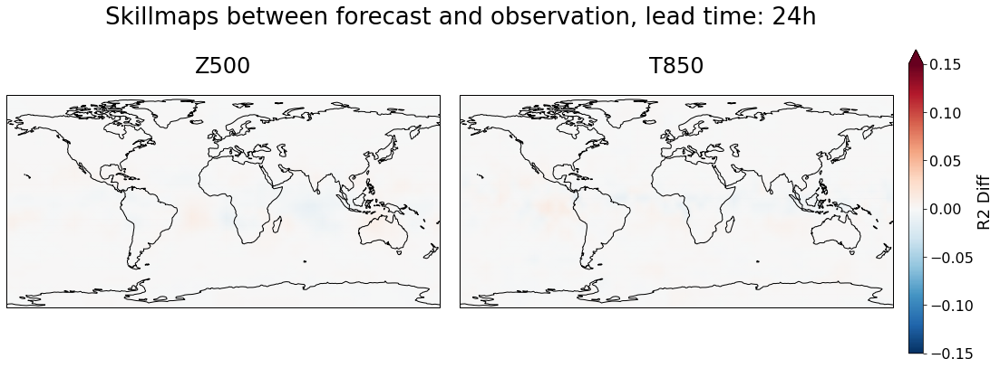

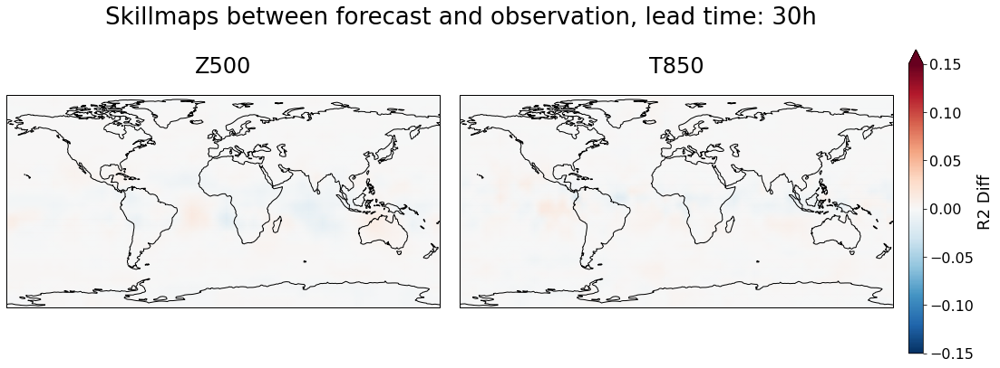

...

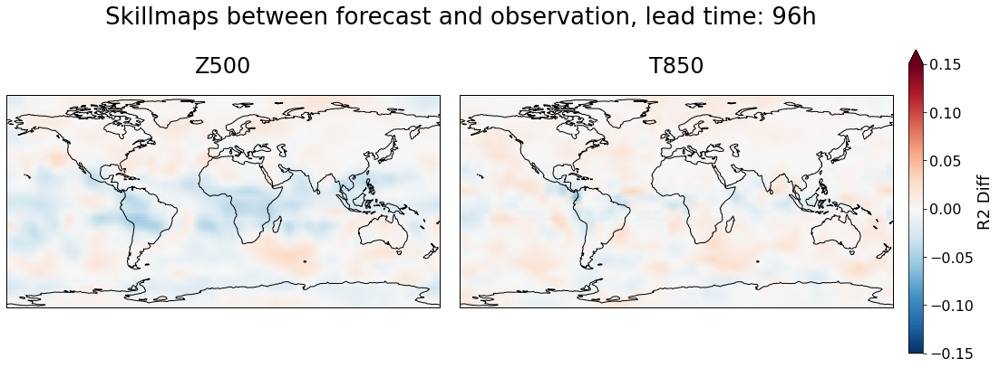

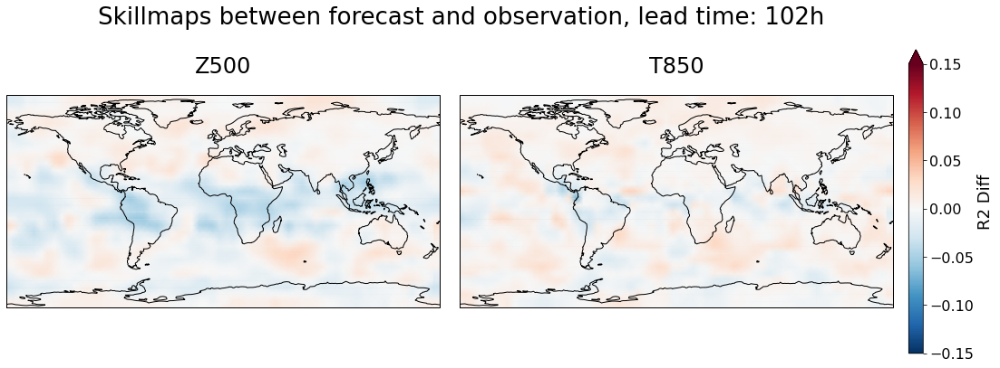

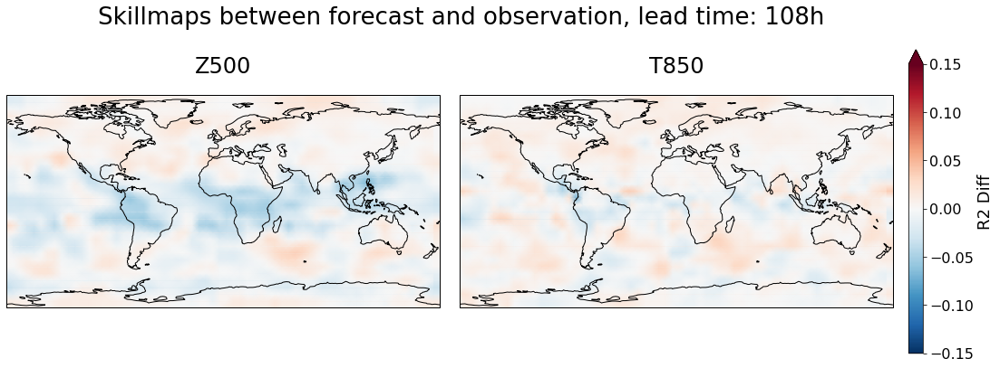

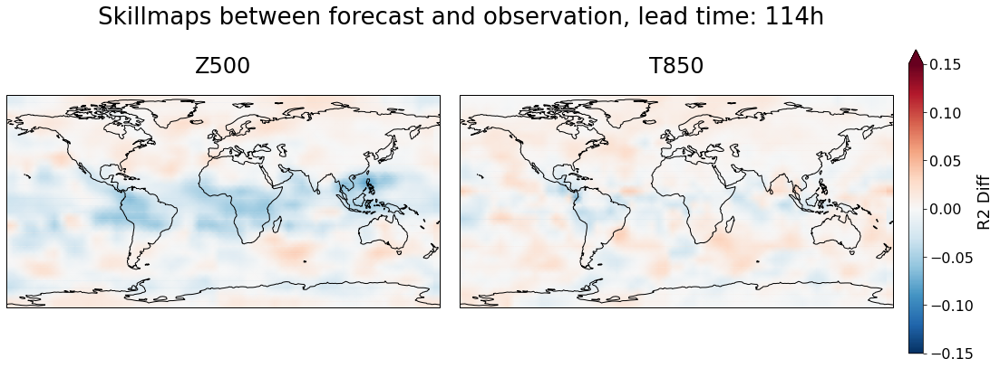

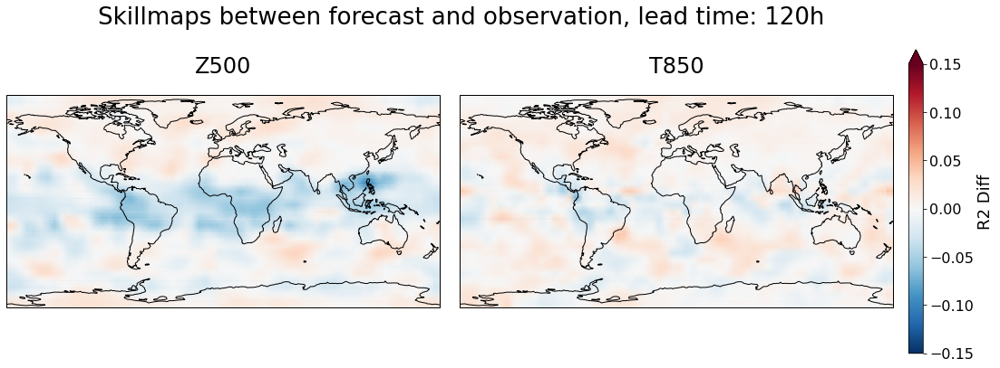

In [13]:
plot_intervalmap(diff, description_epoch, 'R2 Diff', lead_times, resolution, figures_path, min_max=[-0.15,0.15], 
                 save=False)

## RMSE

In [14]:
dims = ('time')
rmse_multiswag = np.sqrt(((multiswag_ds - obs) ** 2).mean(dims)).drop('lat').drop('lon').load()
rmse_ens = np.sqrt(((ens_ds - obs) ** 2).mean(dims)).drop('lat').drop('lon').load()

In [15]:
obs_rmse = obs.mean(('node', 'time')) #np.sqrt(((obs)**2).mean(('node', 'time')))
rmse_multiswag_norm = rmse_multiswag / obs_rmse
rmse_ens_norm = rmse_ens / obs_rmse

In [16]:
diff_rmse = (rmse_multiswag - rmse_ens).load()

In [17]:
diff_rmse_norm = (rmse_multiswag_norm - rmse_ens_norm).load()

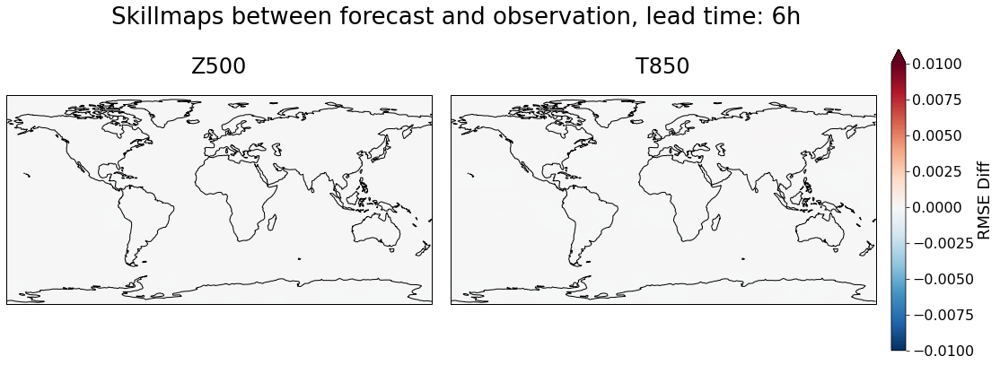

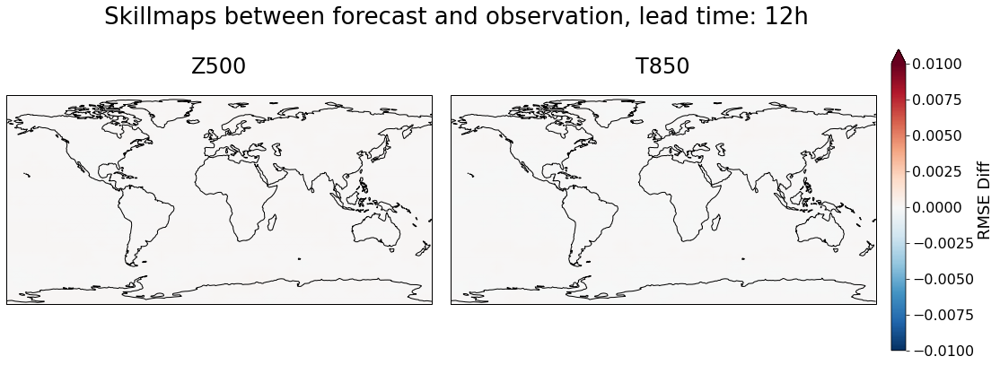

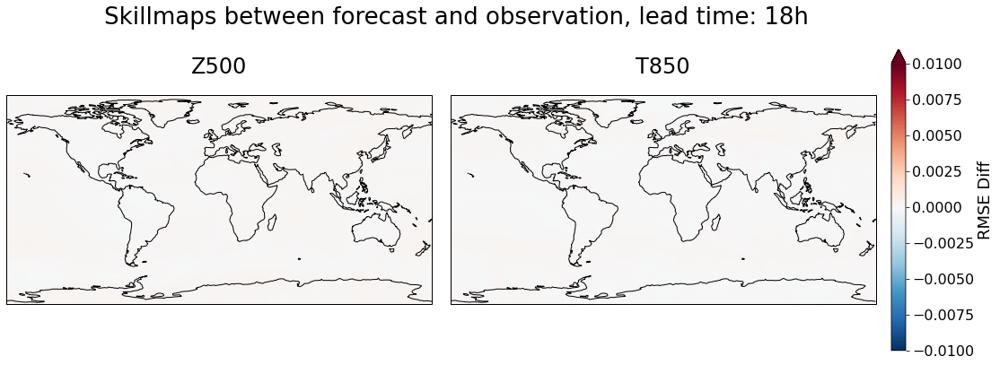

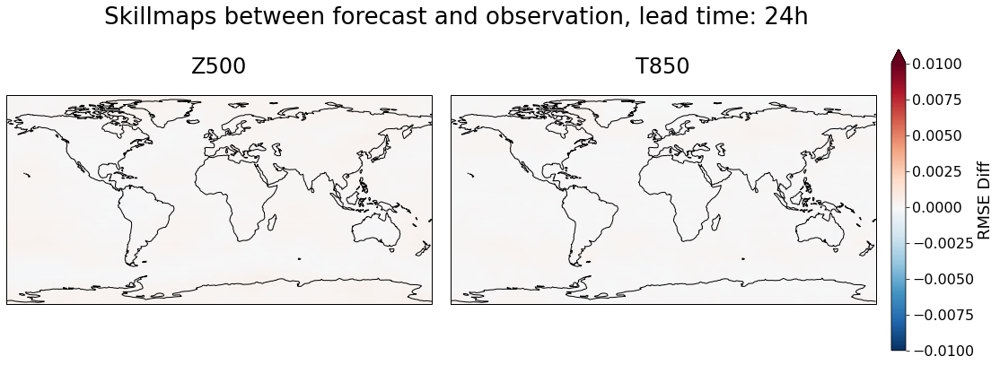

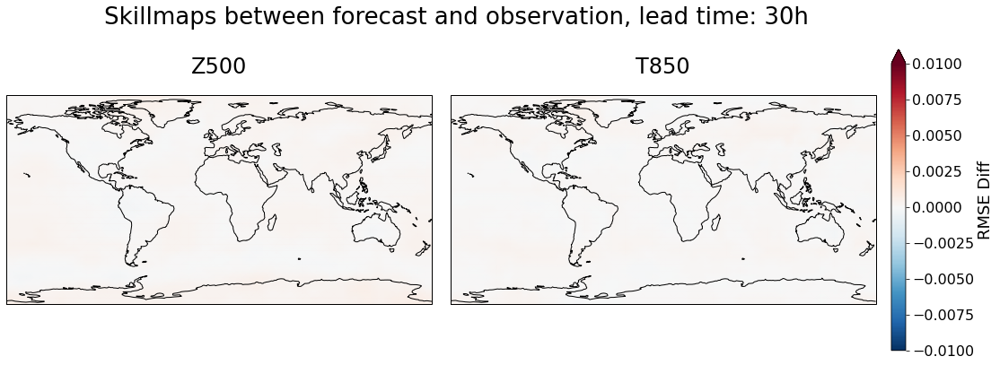

...

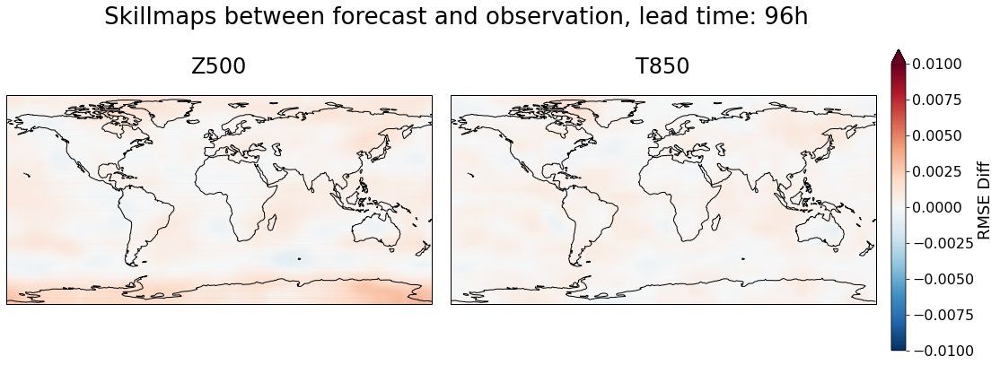

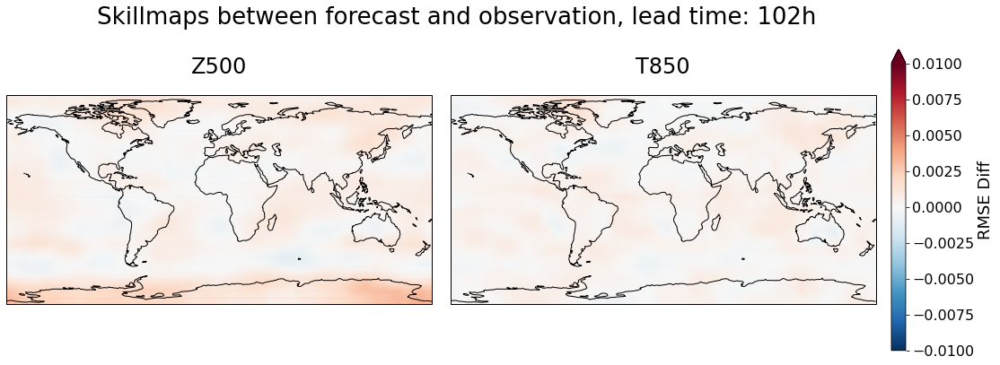

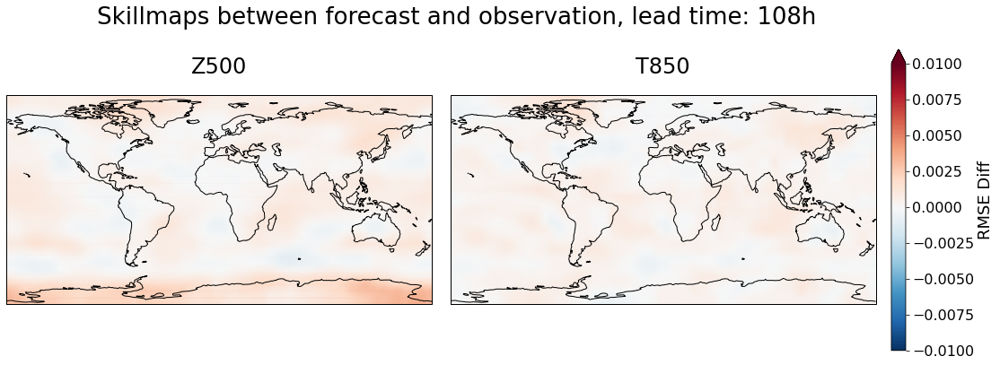

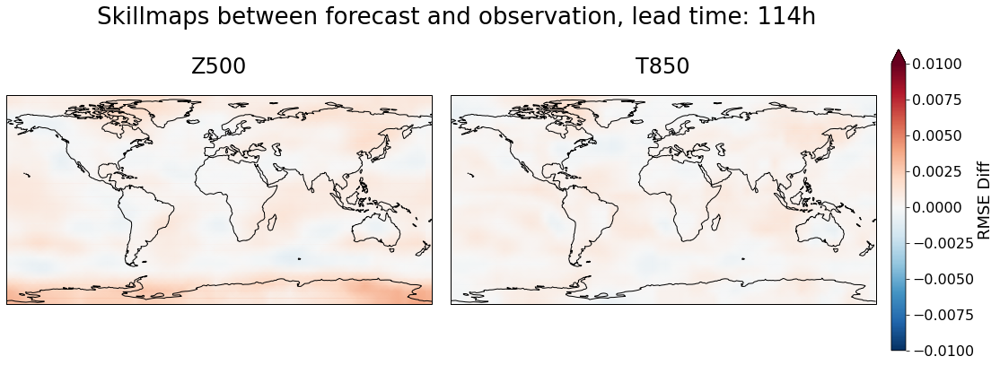

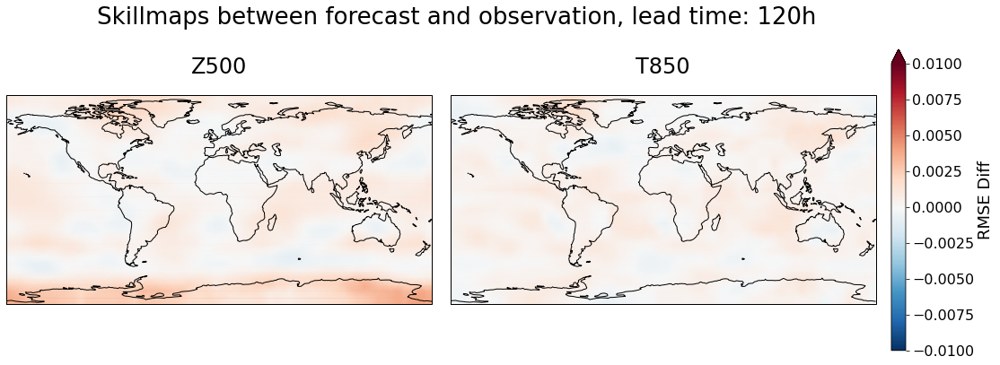

In [18]:
plot_intervalmap(diff_rmse_norm, description_epoch, 'RMSE Diff', lead_times, resolution, figures_path, min_max=[-0.01,0.01], 
                 save=False)